# Computer Vision 2023 Assignment 2: Image matching and retrieval
TC University of Adelaide  
kevin.ferreira@student.adelaide.edu.au

___  
## Introduction  
The purpose of this assignment is to experiment with image feature detectors, descriptors and matching. 
First, we will match an object in a pair of images then search for an object in a collection of images.

Here we will focus on the ORB technique which is an improvement of the FAST and BRIEF algorithms. According to the literature, the ORB algorithm is more robust to changes in image orientation and scale and can therefore be used to detect and match features across multiple images with different orientations and scales.

In this assignment we will understand how the algorithm works and what the key parameters are.  
___

In [120]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [121]:
!pwd
%cd /content/drive/MyDrive/ComputerVision/A2
!pwd

/content/drive/My Drive/ComputerVision/A2
/content/drive/MyDrive/ComputerVision/A2
/content/drive/MyDrive/ComputerVision/A2


In [5]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [6]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)
    img = query.copy()
    img = cv2.polylines(img,[np.int32(dst)],True,255,3, cv2.LINE_AA)
    plt.imshow(img, 'gray'), plt.show()

def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography() 
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    num_inliers = sum(matchesMask)
    plt.imshow(img3, 'gray'),plt.show()
    return num_inliers


___
## Question 1: Matching an object in a pair of images (60%)

In this question, we seek to accurately locate a reference object in an image. To do this, ORB first detects the key points in both images. It then computes a descriptor for each key point. The descriptors are then compared across images to find matches between keypoints.

In [7]:
# load images as grey scale
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd

#plt.figure(figsize=(8, 4))
#plt.subplot(121)
#plt.axis('off')
#plt.imshow(img1)
#plt.subplot(122)
#plt.axis('off')
#plt.imshow(img2)
#plt.show()

In [8]:
def orb_matching(img1, img2, ratio = 0.8, n_features= 500, scale_factor = 1.2, n_levels = 8, edge_Threshold=8, norm = cv2.NORM_HAMMING, plot = True):
  # Your code for descriptor matching tests here
  orb1 = cv2.ORB_create(n_features, scale_factor, n_levels, edge_Threshold)
  orb2 = cv2.ORB_create(n_features, scale_factor, n_levels, edge_Threshold)

  # compute detector and descriptor, see (2) above
  kp1 = orb1.detect(img1, None)
  kp1, des1 = orb1.compute(img1, kp1)

  kp2 = orb2.detect(img2, None)
  kp2, des2 = orb2.compute(img2, kp2)

  # find the keypoints and descriptors with ORB, see (2) above
  img_kp1 = cv2.drawKeypoints(img1, kp1, None)
  img_kp2 = cv2.drawKeypoints(img2, kp2, None)

  # create BFMatcher object, see (3) above
  bf = cv2.BFMatcher(norm, crossCheck=False)

  # Match descriptors, see (3) above
  matches = bf.knnMatch(des1, des2, k=2)

  # Apply ratio test, see (3) above
  good = []
  for m, n in matches:
      if m.distance < ratio * n.distance:
          good.append(m)
  # draw keypoints, see (2) above
  if plot:
    gridsize = (2, 2)
    fig = plt.figure(figsize=(10, 8))
    plt.suptitle("Orb_matching with n_features ="+ str(n_features)+", scale_factor = "+ str(scale_factor)+ ", n_levels = "+
                str(n_levels)+", edge_Threshold=" + str(edge_Threshold))
    ax1 = plt.subplot2grid(gridsize, (0, 0), colspan=1, rowspan=1)
    ax2 = plt.subplot2grid(gridsize, (0, 1), colspan=1, rowspan=1)
    ax3 = plt.subplot2grid(gridsize, (1, 0), colspan=2, rowspan=2)

    ax1.imshow(img_kp1)
    ax1.axis('off')
    ax1.set_title("Keypoints of the reference image")
    ax2.imshow(img_kp2)
    ax2.axis('off')
    ax2.set_title("Keypoints of the query image")
  
    # draw matches, see (4) above
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good, None)
    ax3.imshow(img_matches)
    ax3.axis('off')
    ax3.set_title("Matches with ratio " + str(ratio) + " and norm" + str(norm))
  
    plt.show()

  return kp1, des1, kp2, des2, good


Let's take two images, a reference image (a book) and an interogation image (containing the book). The goal is to find the book cover in the image.    
To do this, the ORB algorithm will extract keypoints from the images. Keypoints are points of interest in the image that can be described by a feature vectors.  
Then for each point, a descriptor will be computed. The descriptors are vectors that represent the local features of the image around each keypoint.  
Then, the keypoints and descriptors will be compared in each image using a descriptor matching method (the haming norm).  
Finally, the false matches will be eliminated using a ratio.

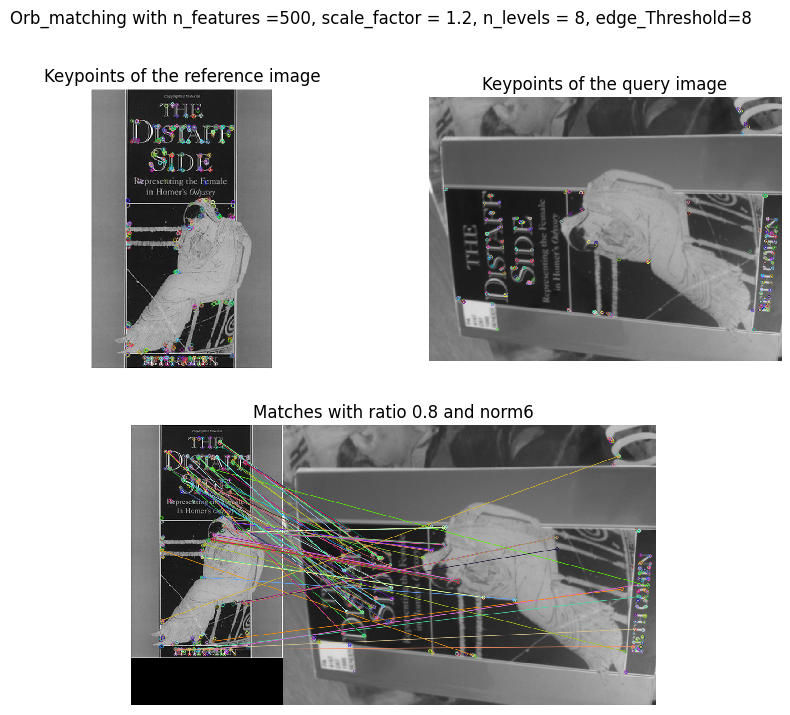

In [9]:
orb_matching(img1, img2);

Let's change the parameters to understand their influence.

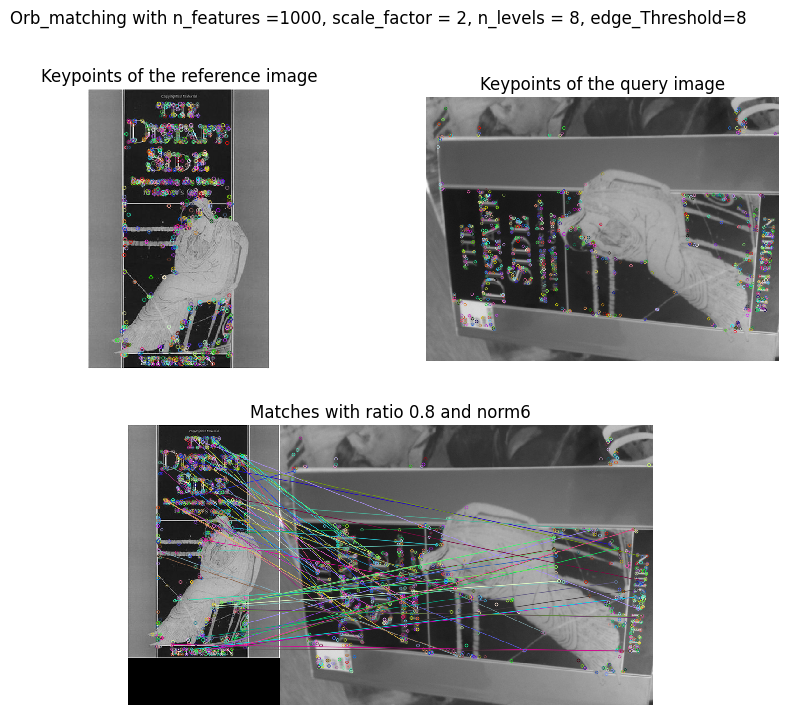

In [10]:
orb_matching(img1, img2, ratio = 0.8, n_features= 1000, scale_factor = 2, n_levels = 8, edge_Threshold=8, norm = cv2.NORM_HAMMING);

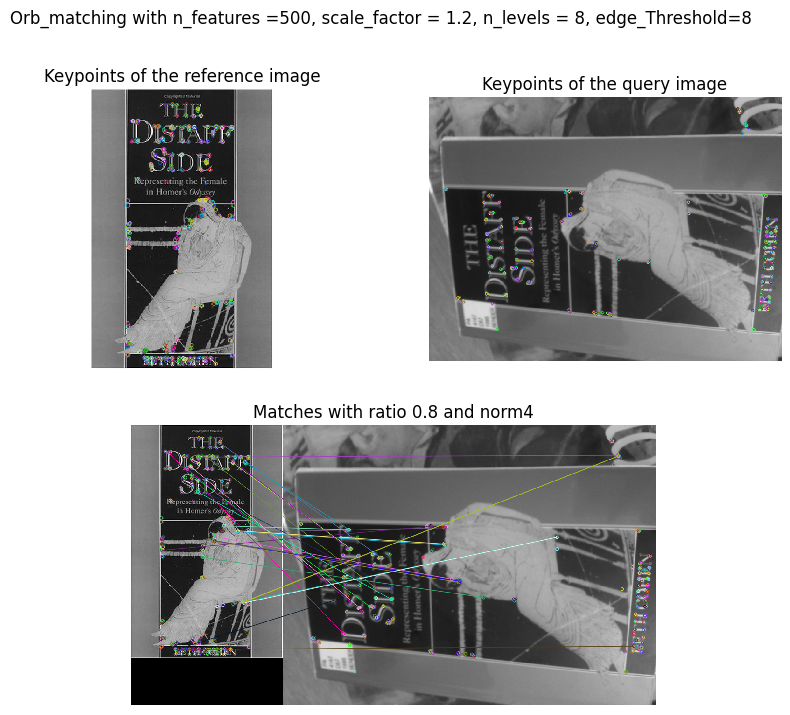

In [11]:
orb_matching(img1, img2, ratio = 0.8, n_features= 500, scale_factor = 1.2, n_levels = 8, edge_Threshold=8, norm = cv2.NORM_L2);

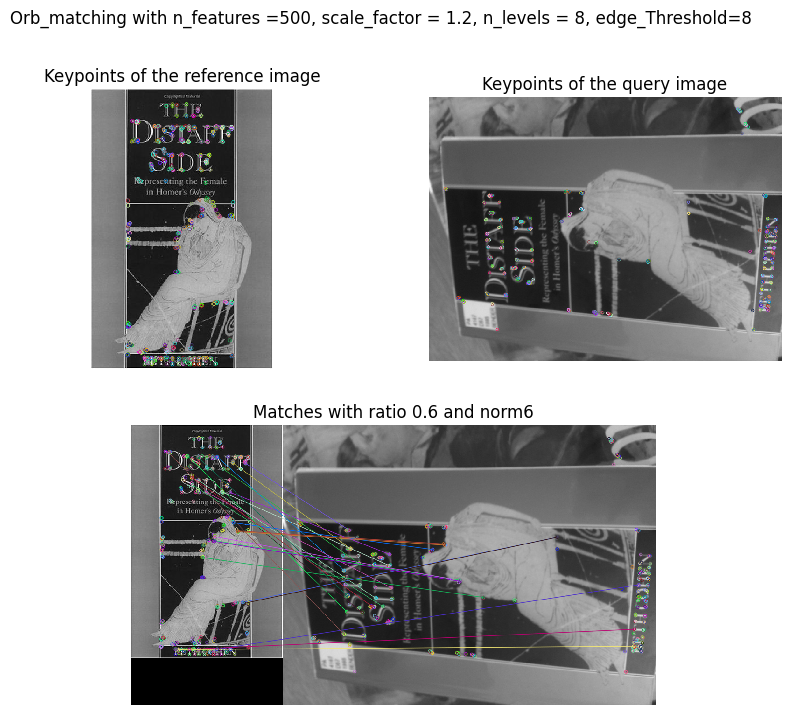

In [12]:
orb_matching(img1, img2, 0.6);

**ORB is a feature detection algorithm used for object recognition and image matching. It is used to extract keypoints from an image and describe them using a descriptor.  
Indeed, after detecting the keypoints based on the difference in gray levels between neighboring pixels, the direction of each detected point is estimated and used to orient the corresponding binary descriptor. This allows ORB to be robust to rotations and deformations, while remaining fast.** 

**The main parameters of ORB_create() :**  
- **nfeatures: this is the maximum number of keypoints to detect. The higher this number is, the more points will be detected, but it can also make the algorithm slower.**  
- **scaleFactor: this is the range used for keypoint detection. A smaller value of the scale allows to detect the points of interest at different scales.**  
- **edgeThreshold: this is the edge detection threshold. Keypoints that are close to the edges of the image will not be detected.**  

**The quality of the results of the keypoint detection and descriptor matching can be significantly affected by the choice of these parameters.    
Indeed, if there are not enough points of interest detected in the image, the algorithm can give a wrong correspondence. Thus, the more detail the image has, the more keypoints are needed.**  

**Then, we associate the keypoints detected in the two different images, using their respective descriptors: we use the search for matches by comparing the descriptors of the keypoints of the reference image with those of the query image. We try to find the closest matches between the descriptors of the two images.  
Here, we look for the closest keypoints to a given point in the query image, using a distance measure.  Moreover, the choice of the distance in cv2.BFMatcher() has an impact on the quality of the matches. By using the Hamming distance, adapted to ORB, we get more accurate matching results. Using the Euclidean distance, some matches are false.**  

**Once the 2 closest keypoints have been found, we apply a test ratio criterion to eliminate the suspicious matches. 
Finally, the ratio is a threshold value used to select the good matches between the descriptors of two images. 
Thus, if the ratio between the distance of the best match and the distance of the second best one is smaller than the ratio, the best match is much better than the second one, and therefore the match is considered as good.
The ratio parameter allows to eliminate questionable matches and to select the most reliable ones between the descriptors of two images.**
___

Now that we have the matches between the keypoints, we look for a homography transformation based on the matches, using `cv2.findHomography()`.
First, let's try with least squares method.

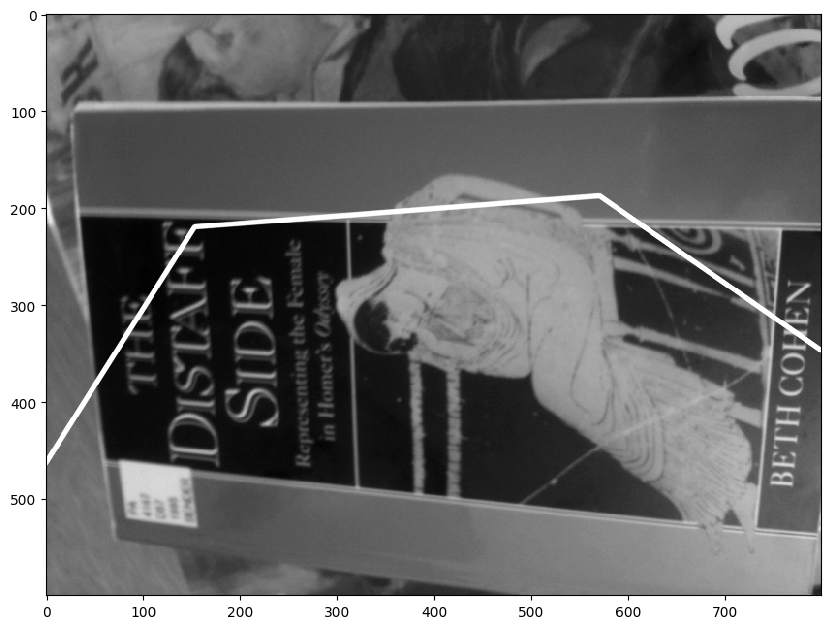

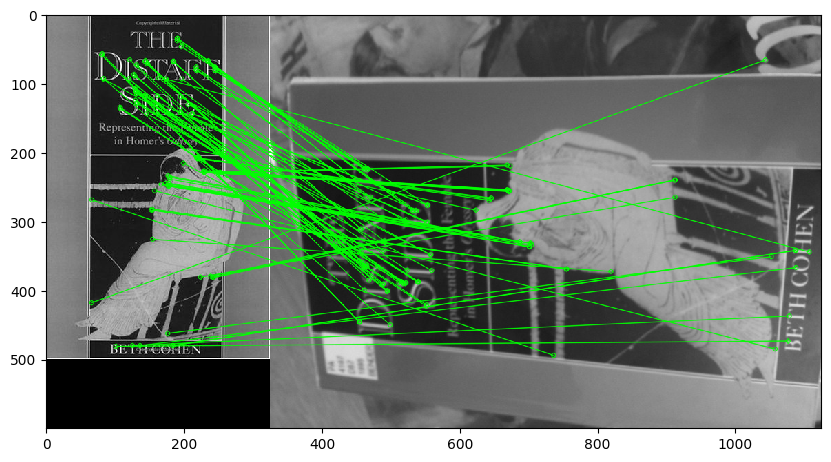

Number of inliers: 97


In [13]:
kp1, des1, kp2, des2, good = orb_matching(img1, img2, n_features= 500, plot=False);

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using cv2 standard method, see (3) above
M, mask = cv2.findHomography(src_pts, dst_pts, 0)

# draw frame
draw_outline(img1, img2, M)
# draw inliers
num_inliers = draw_inliers(img1, img2, kp1, kp2, good, mask)
print("Number of inliers:", num_inliers)


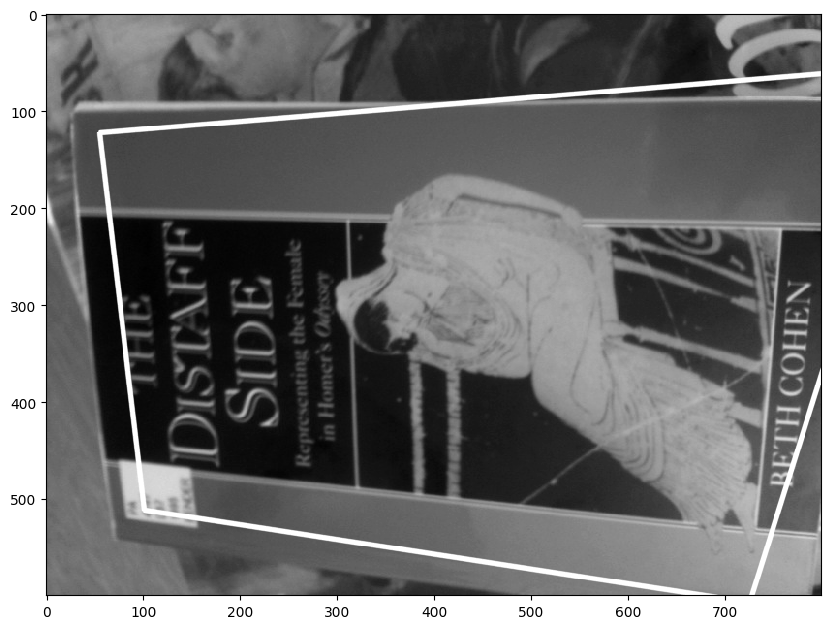

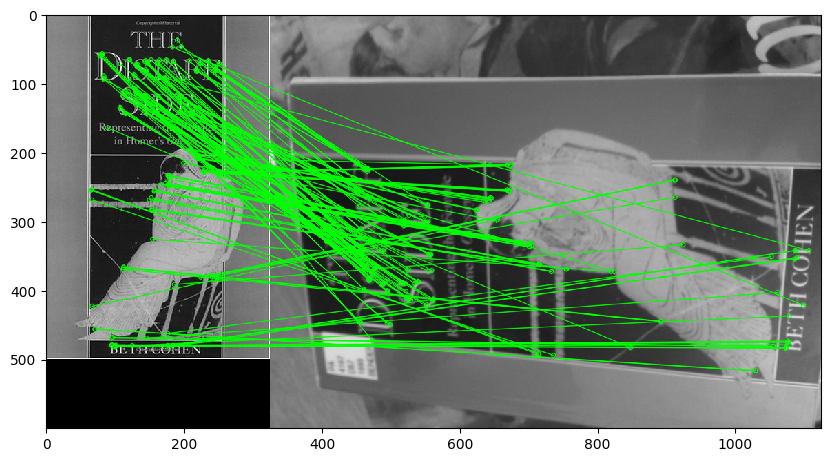

Number of inliers: 181


In [14]:
kp1, des1, kp2, des2, good = orb_matching(img1, img2, n_features= 1000, plot=False);

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using cv2 standard method, see (3) above
M, mask = cv2.findHomography(src_pts, dst_pts, 0)

# draw frame
draw_outline(img1, img2, M)
# draw inliers
num_inliers = draw_inliers(img1, img2, kp1, kp2, good, mask)
print("Number of inliers:", num_inliers)

**The least squares method consists in minimizing the sum of the squares of the distances between the keypoints of the observation image and the keypoints of the model. However, it is very sensitive to outliers and noise. Indeed, the least squares method uses all the points, including the outliers, of correspondence to estimate the homographic transformation. This method tends to produce an accurate homography transformation when the number of inliers is high.**

Now let's try with the RANSAC option to calculate the homography. 

ransacReprojThreshold =  3 ; maxIters =  2000 ; confidence =  0.995


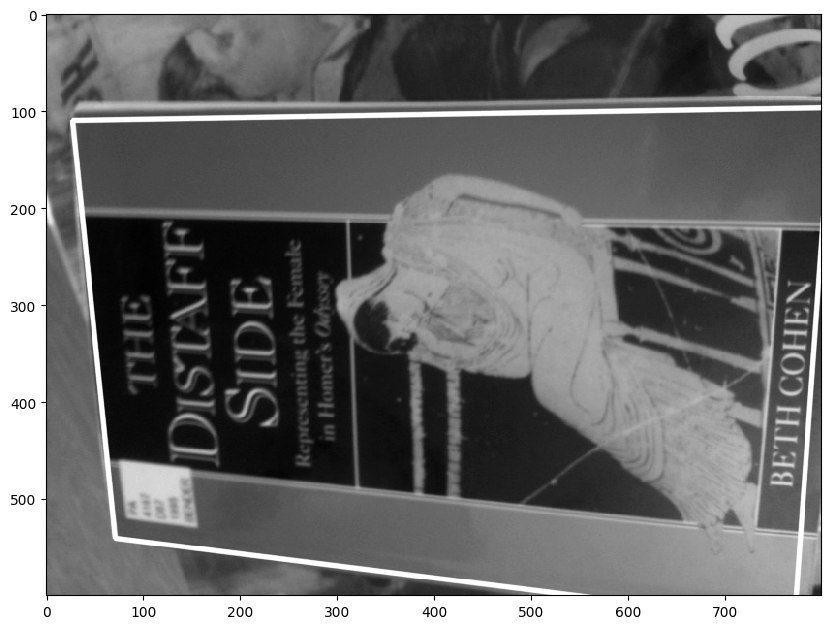

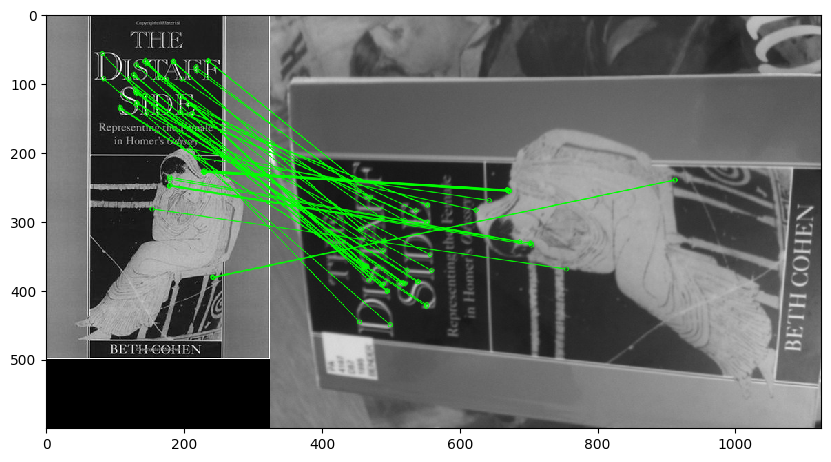

Number of inliers: 54


In [15]:
# Your code to display book location after RANSAC here
kp1, des1, kp2, des2, good = orb_matching(img1, img2, n_features= 500, plot=False);

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold = 3, maxIters = 2000, confidence = 0.995)

print("ransacReprojThreshold = ", 3, "; maxIters = ", 2000, "; confidence = ", 0.995)
# draw frame
draw_outline(img1, img2, M)
# draw inliers
num_inliers = draw_inliers(img1, img2, kp1, kp2, good, mask)
print("Number of inliers:", num_inliers)

ransacReprojThreshold =  10 ; maxIters =  2000 ; confidence =  0.995


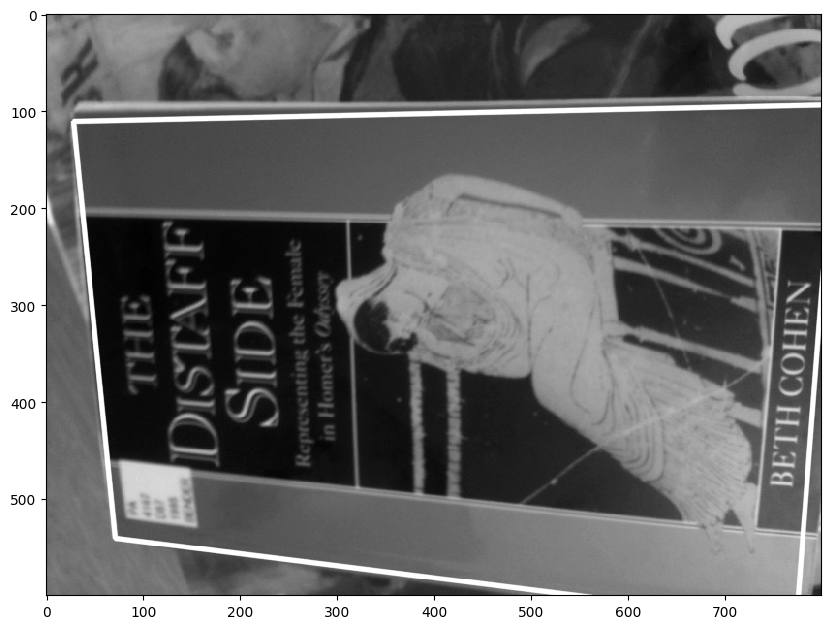

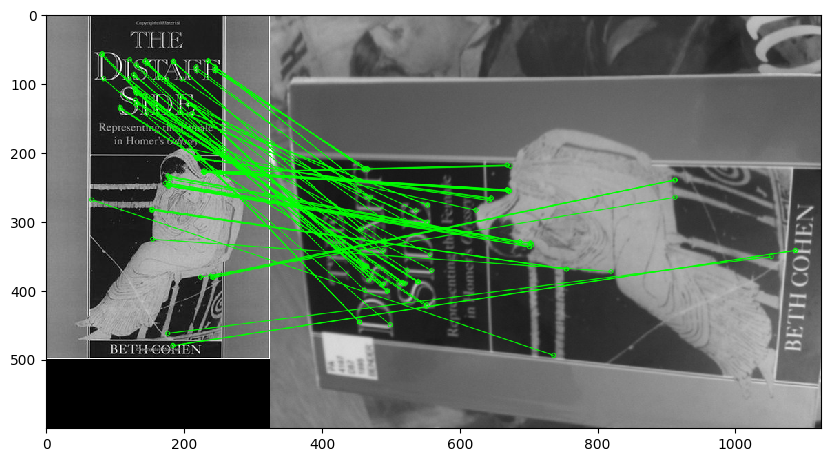

Number of inliers: 80


In [16]:
# Your code to display book location after RANSAC here
kp1, des1, kp2, des2, good = orb_matching(img1, img2, n_features= 500, plot=False);

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold = 10, maxIters = 2000, confidence = 0.995)

print("ransacReprojThreshold = ", 10, "; maxIters = ", 2000, "; confidence = ", 0.995)
# draw frame
draw_outline(img1, img2, M)
# draw inliers
num_inliers = draw_inliers(img1, img2, kp1, kp2, good, mask)
print("Number of inliers:", num_inliers)

ransacReprojThreshold =  3 ; maxIters =  1 ; confidence =  0.995


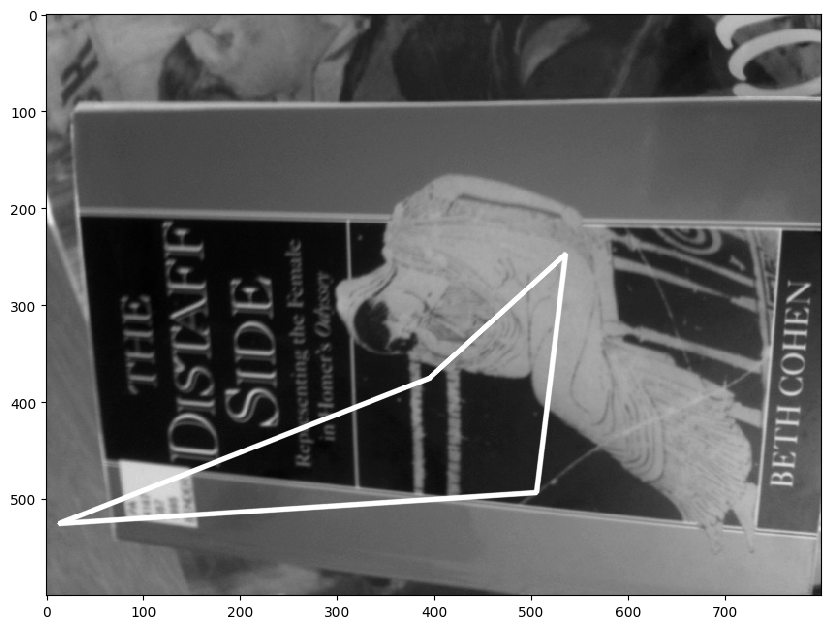

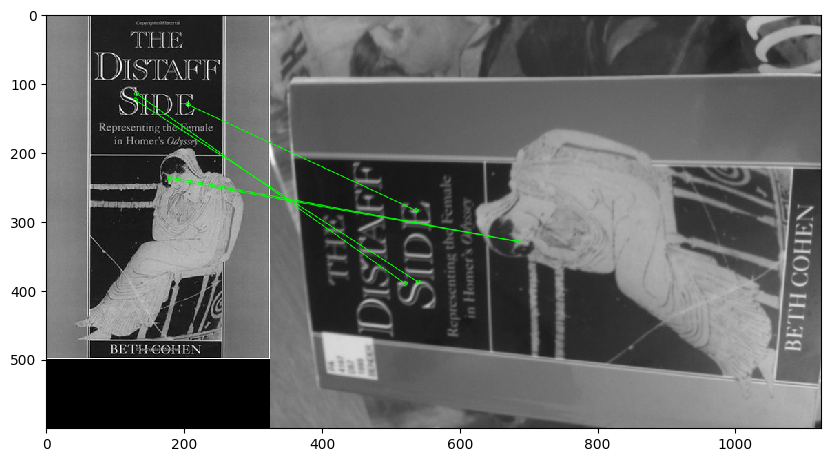

Number of inliers: 5


In [17]:
# Your code to display book location after RANSAC here
kp1, des1, kp2, des2, good = orb_matching(img1, img2, n_features= 500, plot=False);

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold = 3, maxIters = 1, confidence = 0.995)

print("ransacReprojThreshold = ", 3, "; maxIters = ", 1, "; confidence = ", 0.995)
# draw frame
draw_outline(img1, img2, M)
# draw inliers
num_inliers = draw_inliers(img1, img2, kp1, kp2, good, mask)
print("Number of inliers:", num_inliers)

ransacReprojThreshold =  3 ; maxIters =  2000 ; confidence =  0.999


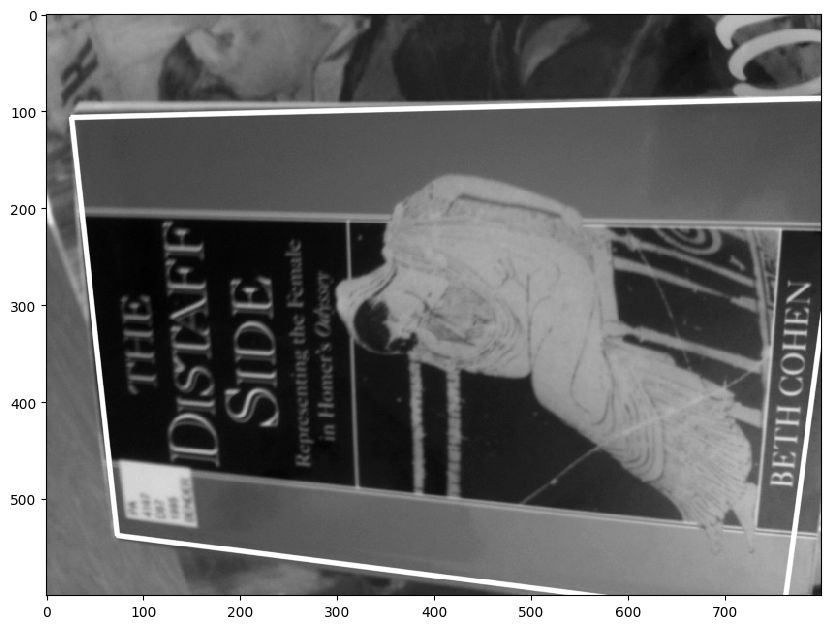

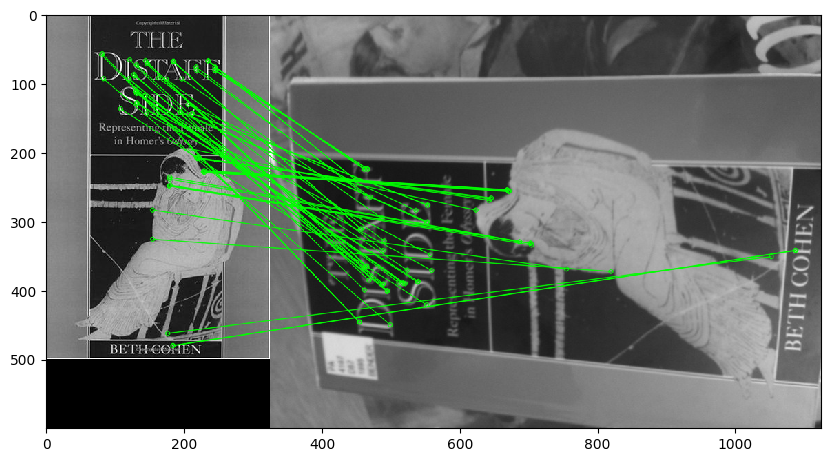

Number of inliers: 60


In [18]:
# Your code to display book location after RANSAC here
kp1, des1, kp2, des2, good = orb_matching(img1, img2, n_features= 500, plot=False);

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransacReprojThreshold = 3, maxIters = 2000, confidence = 0.999)

print("ransacReprojThreshold = ", 3, "; maxIters = ", 2000, "; confidence = ", 0.999)
# draw frame
draw_outline(img1, img2, M)
# draw inliers
num_inliers = draw_inliers(img1, img2, kp1, kp2, good, mask)
print("Number of inliers:", num_inliers)

**The RANSAC method selects a number of points at random in the data and then estimates a model from the selected points. It assesses the quality of the model by counting the number of inliers and the number of outliers using a distance threshold. By repeating this several times, it can then choose the model that generated the largest number of inliers.
In contrast to the least squares method, the RANSAC method is more robust to outliers because it only takes into account the inliers when estimating the model. Moreover, this method is more robust to noise because it only takes into account a small sample of key points at a time. It can therefore identify and reject outliers by fitting the homographic transformation several times with different samples.**

**Ransac has 3 parameters.   
First, reprojThreshold, determines the distance of a point from the estimated model to be considered an outlier. Increasing this value allows more outliers to be included in the model, while decreasing it makes the algorithm more strict in rejecting outliers.  
Second, maxIters is the maximum number of iterations to run the RANSAC algorithm i.e. the number of times the algorithm randomly samples subsets of points and estimates the model parameters. Increasing this value increases the chances of finding a good model, but also increases the computation time.  
Finally, confidence is the desired level of confidence in the estimated model and controls the probability that the algorithm finds a good model.**

Finally, let's try to match several different pairs of images from the data provided to highlight the problems that may emerge.

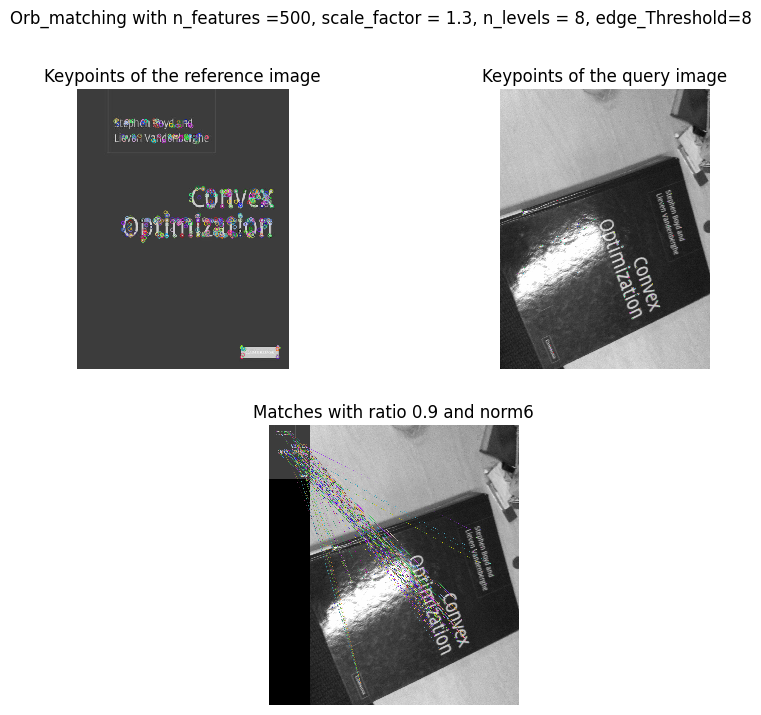

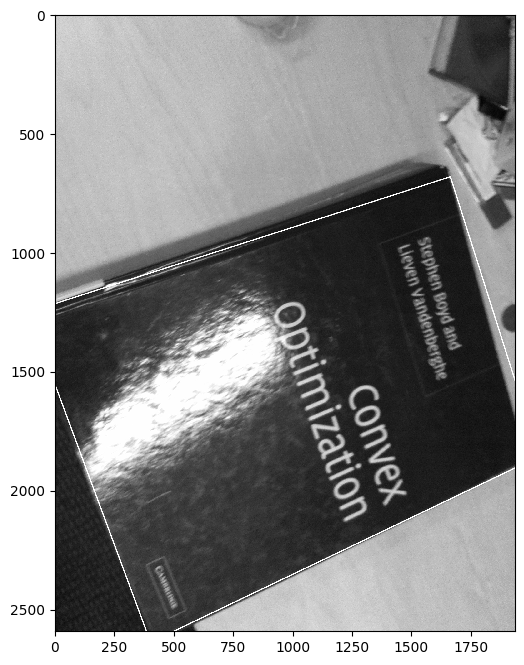

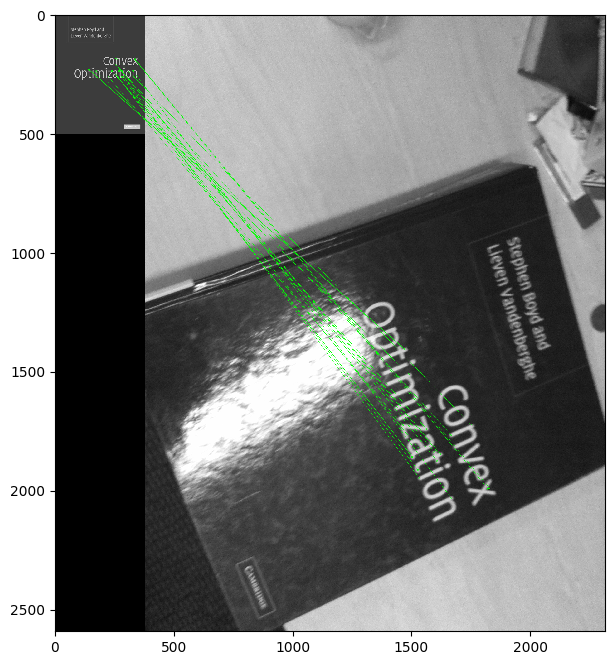

19

In [19]:
# Your results for other image pairs here
img1 = cv2.imread('A2_smvs/book_covers/Reference/069.jpg', 0)
img2 = cv2.imread("A2_smvs/book_covers/Query/069.jpg", 0)

kp1, des1, kp2, des2, good = orb_matching(img1, img2, ratio = 0.9, n_features= 500, scale_factor = 1.3, n_levels = 8, edge_Threshold=8, 
                                          norm = cv2.NORM_HAMMING, plot = True)

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)

# draw frame
draw_outline(img1, img2, M)
# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

In this case, the photo is well exposed, all the details are well visible, and the book is at the right scale. There are no identification problems.

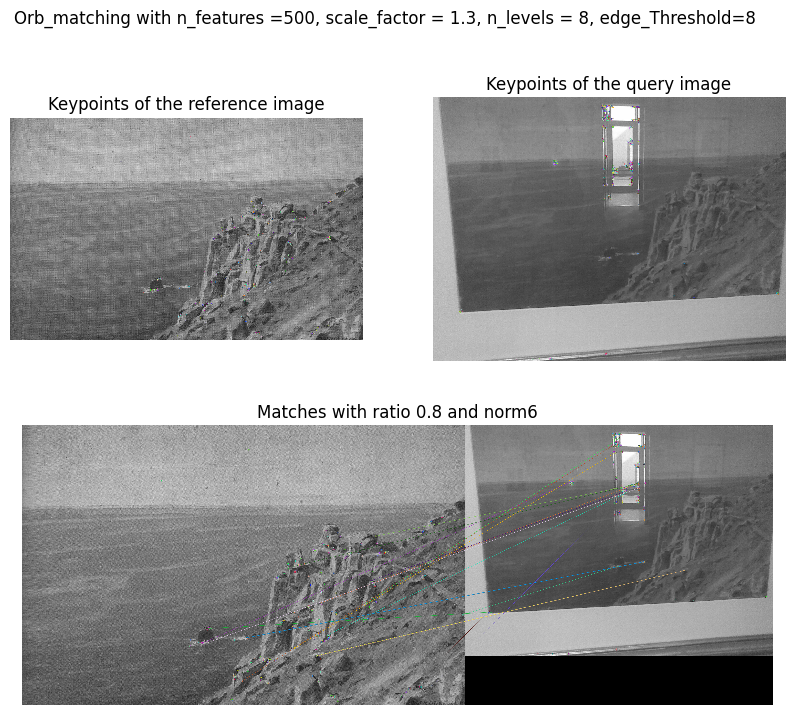

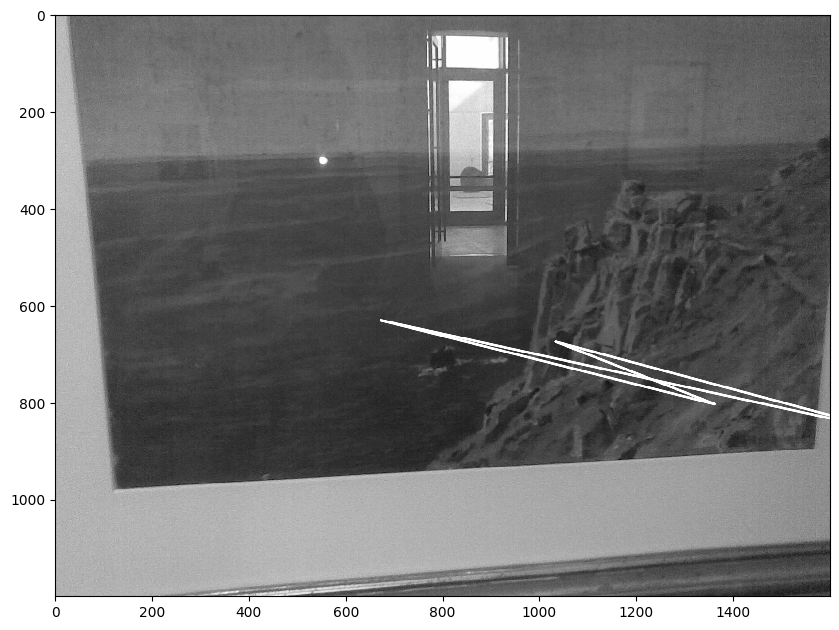

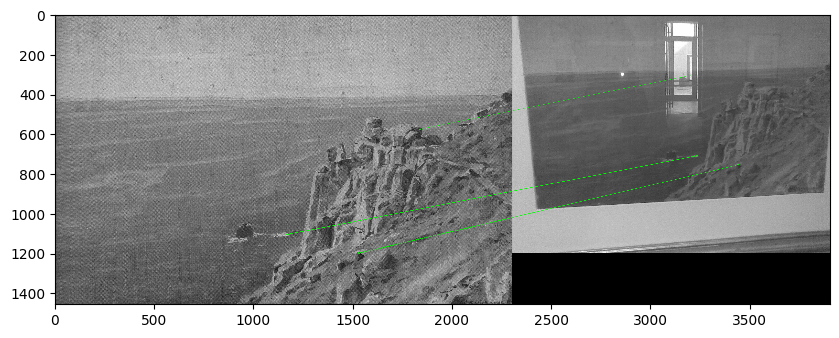

6

In [20]:
# Your results for other image pairs here
img1 = cv2.imread('A2_smvs/museum_paintings/Reference/046.jpg', 0)
img2 = cv2.imread("A2_smvs/museum_paintings/Query/046.jpg", 0)

kp1, des1, kp2, des2, good = orb_matching(img1, img2, ratio = 0.8, n_features= 500, scale_factor = 1.3, n_levels = 8, edge_Threshold=8, 
                                          norm = cv2.NORM_HAMMING, plot = True)

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)

# draw frame
draw_outline(img1, img2, M)
# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

We notice here that the photo is not correctly exposed. The feature detector does not work well in the photo query: indeed, some keypoints are due to the overexposure of the image by place. It is then necessary to modify the parameters.

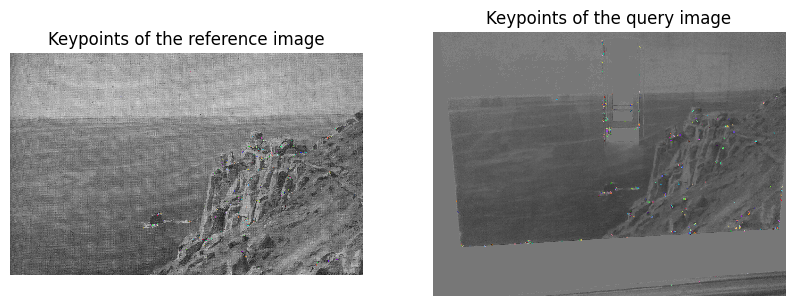

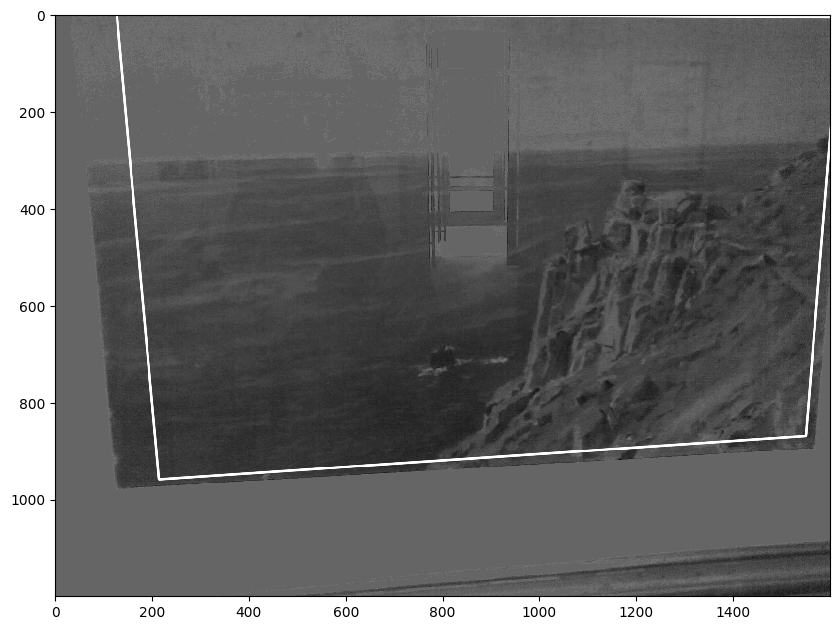

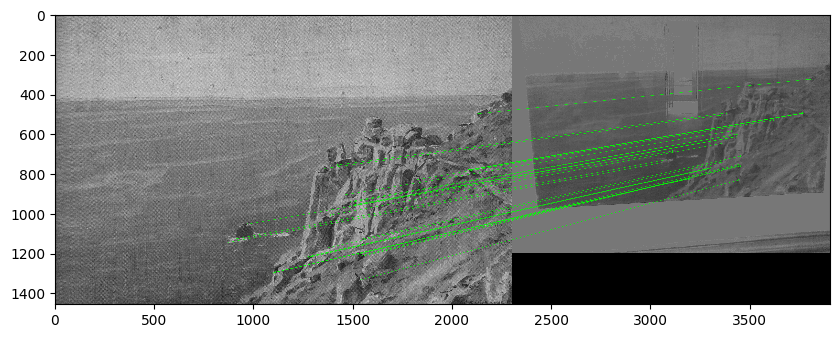

30

In [21]:
img1 = cv2.imread('A2_smvs/museum_paintings/Reference/046.jpg', 0)
img2 = cv2.imread("A2_smvs/museum_paintings/Query/046.jpg", 0)
img2[img2>130] = np.mean(img2)
# Your code for descriptor matching tests here
orb1 = cv2.ORB_create(nfeatures = 500, scaleFactor = 1.4, nlevels = 10, patchSize = 25)
orb2 = cv2.ORB_create(nfeatures = 500, scaleFactor = 1.4, nlevels = 10, edgeThreshold = 10, patchSize = 25)

# compute detector and descriptor, see (2) above
kp1 = orb1.detect(img1, None)
kp1, des1 = orb1.compute(img1, kp1)

kp2 = orb2.detect(img2, None)
kp2, des2 = orb2.compute(img2, kp2)

# find the keypoints and descriptors with ORB, see (2) above
img_kp1 = cv2.drawKeypoints(img1, kp1, None)
img_kp2 = cv2.drawKeypoints(img2, kp2, None)

# create BFMatcher object, see (3) above
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)

# Match descriptors, see (3) above
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test, see (3) above
good = []
ratio = 0.8
for m, n in matches:
    if m.distance < ratio * n.distance:
      good.append(m)
#Plot
gridsize = (1, 2)
fig = plt.figure(figsize=(10, 8))
ax1 = plt.subplot2grid(gridsize, (0, 0), colspan=1, rowspan=1)
ax2 = plt.subplot2grid(gridsize, (0, 1), colspan=1, rowspan=1)

ax1.imshow(img_kp1)
ax1.axis('off')
ax1.set_title("Keypoints of the reference image")
ax2.imshow(img_kp2)
ax2.axis('off')
ax2.set_title("Keypoints of the query image")
plt.show()
# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)
# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)
# draw frame
draw_outline(img1, img2, M)
# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

To identify the picture, we can pre-process the image in order to reduce the bright points of the image corresponding to a reflection. Then, we increase the scaleFactor to look for bigger details in the image.

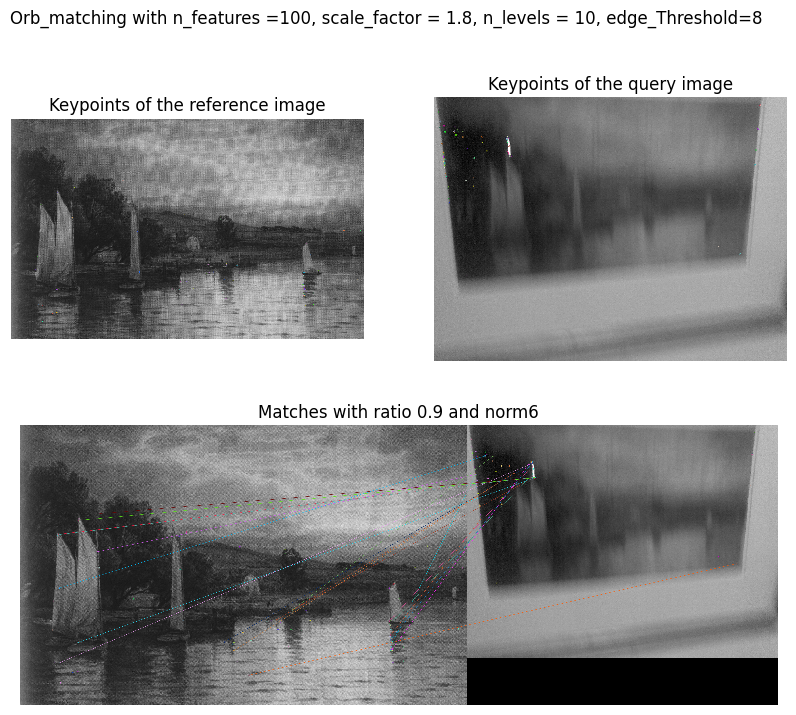

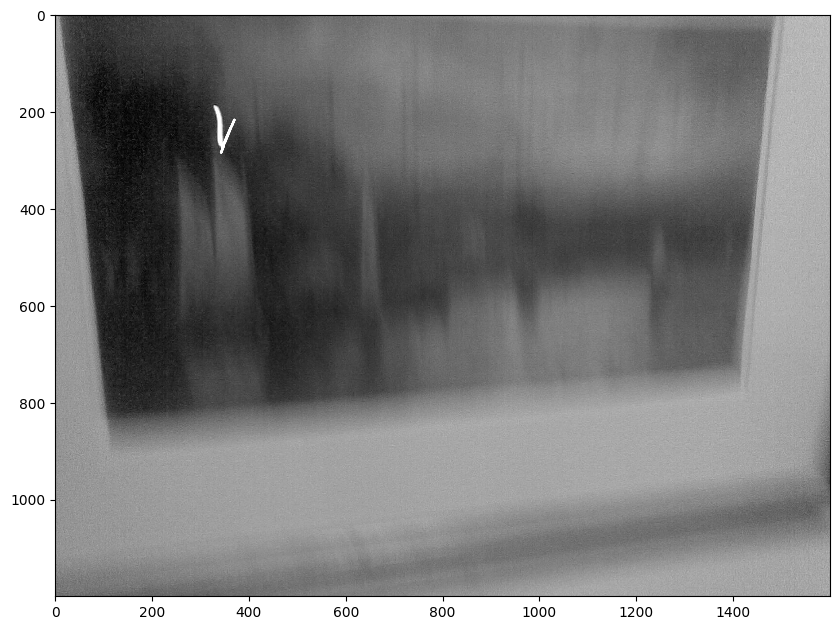

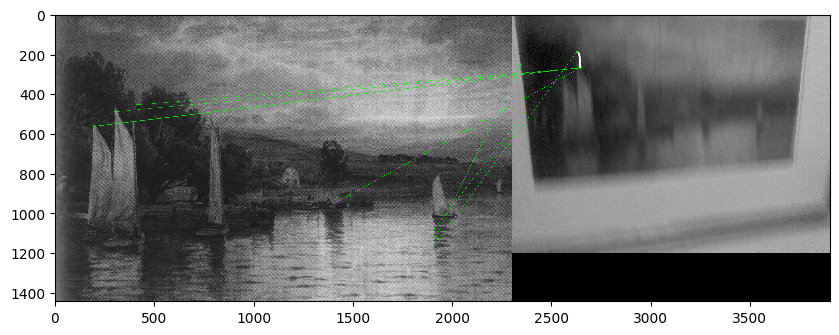

8

In [22]:
# Your results for other image pairs here
img1 = cv2.imread('A2_smvs/museum_paintings/Reference/056.jpg', 0)
img2 = cv2.imread("A2_smvs/museum_paintings/Query/056.jpg", 0)

kp1, des1, kp2, des2, good = orb_matching(img1, img2, ratio = 0.9, n_features= 100, scale_factor = 1.8, n_levels = 10, edge_Threshold=8, 
                                          norm = cv2.NORM_HAMMING, plot = True)

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)

# draw frame
draw_outline(img1, img2, M)
# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

Here, the image is blurred and the detection of keypoints is difficult. To improve this, you need to detect large details by increasing scaleFactor and thus compensate for the blur of the image. 

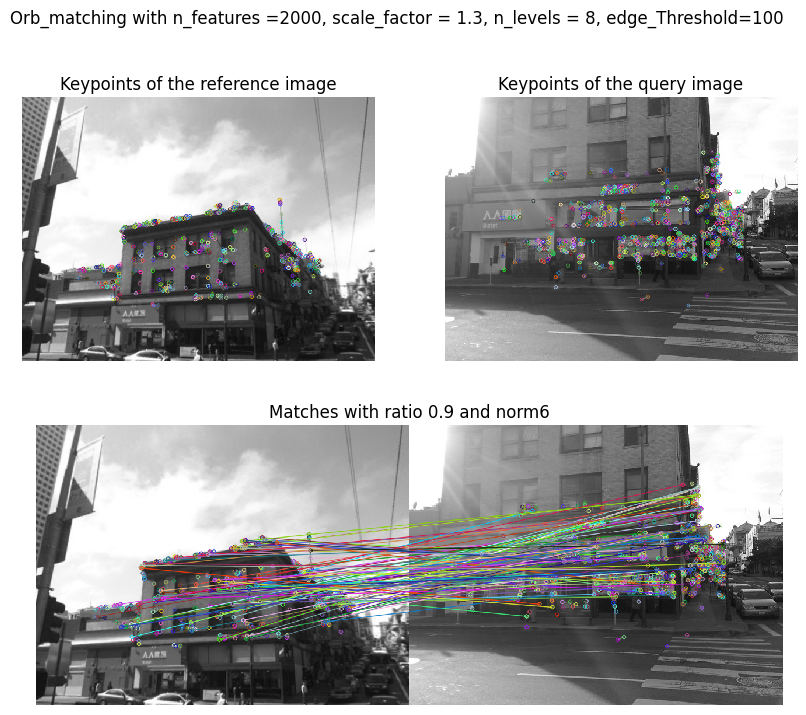

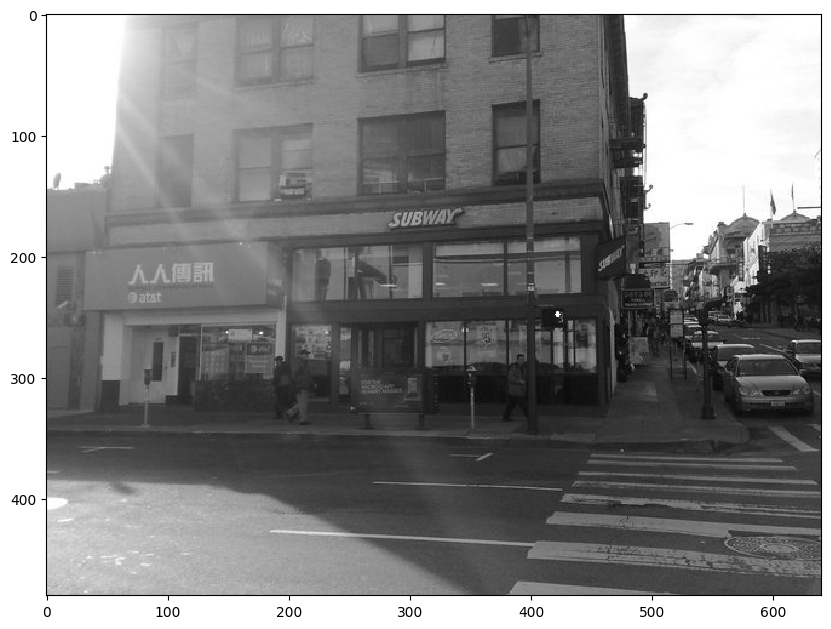

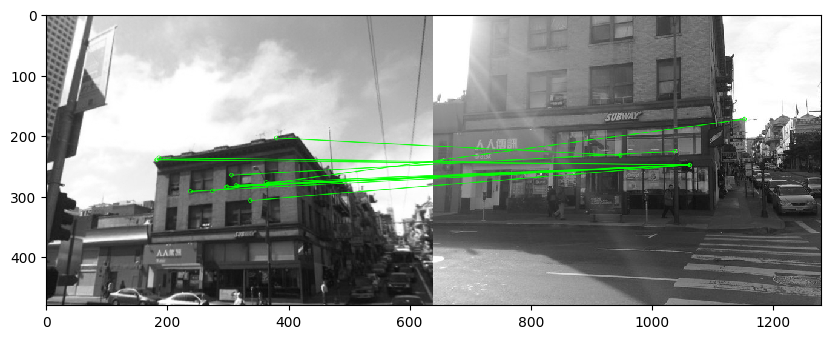

14

In [23]:
# Your results for other image pairs here
img1 = cv2.imread('A2_smvs/landmarks/Reference/030.jpg', 0)
img2 = cv2.imread("A2_smvs/landmarks/Query/030.jpg", 0)

kp1, des1, kp2, des2, good = orb_matching(img1, img2, ratio = 0.9, n_features= 2000, scale_factor = 1.3, n_levels = 8, edge_Threshold=100, 
                                          norm = cv2.NORM_HAMMING, plot = True)

# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)

# draw frame
draw_outline(img1, img2, M)
# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

Here, the two images are not at the same scale and are not oriented in the same way. As a result, the keypoints are not described in the same way on the two pictures and so matching them correctly is impossible.

**An image can affect the performance of the feature detector, feature descriptor and matching strategy in several ways. 
First, the quality of the image can affect the performance of the ORCS. Images that are blurry, noisy, or underexposed can make the feature detection task more difficult.
Moreover, image content also influences the performance of the feature detector and feature descriptor. For example, images that have repetitive patterns or uniform textures can make feature detection difficult.
Finally, image scale and image rotation impact performance. For example, large scale images require different feature detectors than small scale images. In addition, the detected features may be oriented differently and therefore more difficult to match.**

**Thus, to address its problems, feature detectors and feature descriptors must be chosen based on the scale of the image and their orientation. For example, for large-scale images, the scale of the feature detectors must be changed.**

## Question 2: What am I looking at? (40%)

In [123]:
from a2code import *

In this question, the objective is to identify an "unknown" object depicted in an image by matching it to several reference images and selecting the match with the highest score. 

In [25]:
name_ref = "A2_smvs/book_covers/Reference/"
name_que = "A2_smvs/book_covers/Query/"
images_ref, images_que = import_img(name_ref, name_que)

In [26]:
par_references, par_query = get_param(images_que[:101], images_ref, n_features= 1000)

Let's first try to identify an image by matching it to an image in an image bank

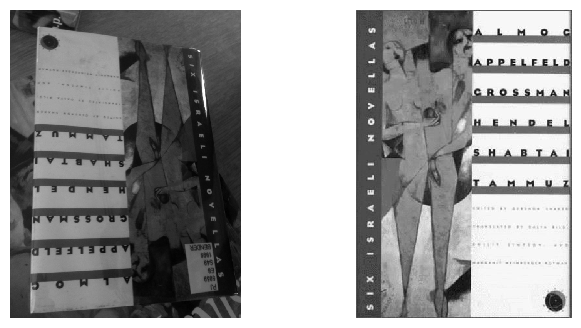

In [27]:
n = 52
query_image = images_que[n - 1]
best_score_1= identify_image(query_image, images_ref, par_references, par_query[n])
plt.figure(figsize=(8, 4))
plt.subplot(121)
plt.axis('off')
ax1.set_title("Query Image")
plt.imshow(query_image[1])
plt.subplot(122)
plt.axis('off')
ax1.set_title("Best match")
plt.imshow(images_ref[best_score_1[0][0]-1][1])
plt.show()

Here, we see that the image is well identified since the reference image with the highest score corresponds to the solution.

Let's try to estimate the accuracy of the identification by repeating this for all images.

In [28]:
best_score = identify_images(images_que[:101], images_ref, par_references, par_query)

In [29]:
n = len(best_score)
accuracy = 0
wrong = []
for i in range(1, n+1):
  score_i = best_score[i]
  correct = False
  for j in range(len(score_i)):
    if i == score_i[j][0]:
      accuracy+=1
      correct = True
  if not correct:
    wrong.append(i)
print("Accuracy =", accuracy/n)
print("Wrongs=", wrong)

Accuracy = 0.6831683168316832
Wrongs= [33, 37, 55, 59, 63, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 78, 79, 80, 82, 83, 84, 86, 87, 88, 89, 90, 91, 93, 97, 98, 100, 101]


We can see that 68% of the images have been ranked well. This is due to the fact that most of the cover photos are of good quality and the number and quality of the keypoints and descriptors are adequate. However, there are errors. Let's display some of them with their correspondence.


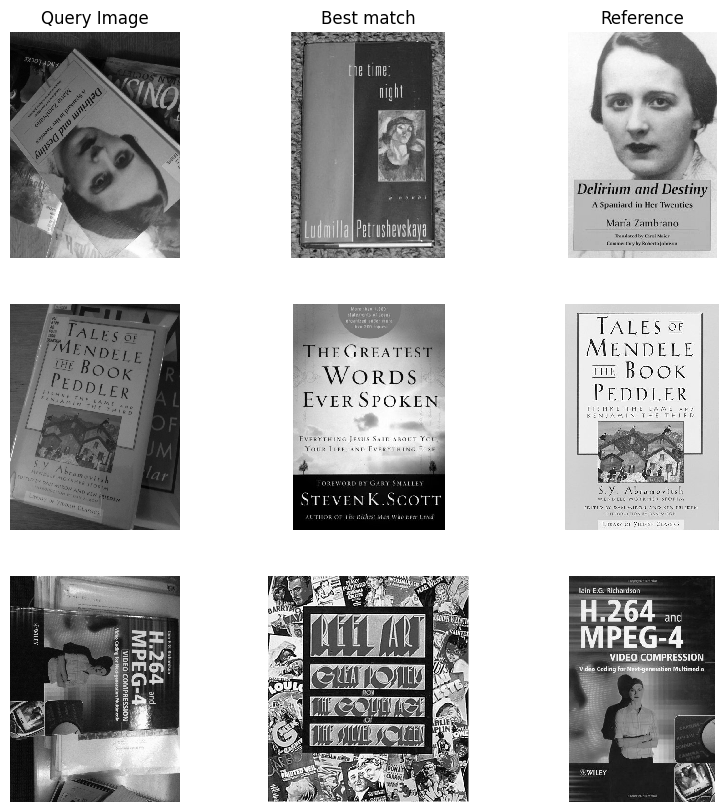

In [30]:
plt.figure(figsize=(10, 10))

plt.subplot(331)
plt.axis('off')
plt.title("Query Image")
plt.imshow(images_que[wrong[0]][1])
plt.subplot(332)
plt.axis('off')
plt.title("Best match")
plt.imshow(images_ref[best_score[wrong[0]][0][0]][1])
plt.subplot(333)
plt.axis('off')
plt.title("Reference")
plt.imshow(images_ref[wrong[0]][1])

plt.subplot(334)
plt.axis('off')
plt.imshow(images_que[wrong[1]][1])
plt.subplot(335)
plt.axis('off')
plt.imshow(images_ref[best_score[wrong[1]][0][0]][1])
plt.subplot(336)
plt.axis('off')
plt.imshow(images_ref[wrong[1]][1])

plt.subplot(337)
plt.axis('off')
plt.imshow(images_que[wrong[2]][1])
plt.subplot(338)
plt.axis('off')
plt.imshow(images_ref[best_score[wrong[2]][0][0]][1])
plt.subplot(339)
plt.axis('off')
plt.imshow(images_ref[wrong[2]][1])

plt.show()




It is noticed that the images have been identified with very apparent covers to it. We notice that between the query image and the reference, in cases of failure, the lighting and/or orientation are very different.  
To improve the identification, one can change the scale to detect features at a more correct scale or increase the number of key points.  

To increase the accuracy, let's see if the solution of the misidentified images is in the first 5 images returned by the algorithm.

In [31]:
wrong_im = [images_que[i-1] for i in wrong]
best_score_wrong_k5 = identify_images(wrong_im, images_ref, par_references, par_query, k=5)

In [32]:
m = len(best_score_wrong_k5)

accuracy_k = accuracy
wrong_k = []

for i in range(m):
  score_i = best_score_wrong_k5[wrong[i]]
  correct = False
  for j in range(len(score_i)):
    if wrong[i] == score_i[j][0]:
      accuracy_k+=1
      correct = True
  if not correct:
    wrong_k.append(wrong[i])
print("accuracy after k =", accuracy_k/n)
print("Wrongs with 5 bests=", wrong_k)

accuracy after k = 0.8217821782178217
Wrongs with 5 bests= [37, 55, 63, 67, 68, 69, 71, 73, 75, 77, 78, 84, 89, 91, 97, 98, 100, 101]


Looking at the top 5 scores, we see that we are increasing accuracy. However, there are still errors. To understand them let's display them with their best matches.

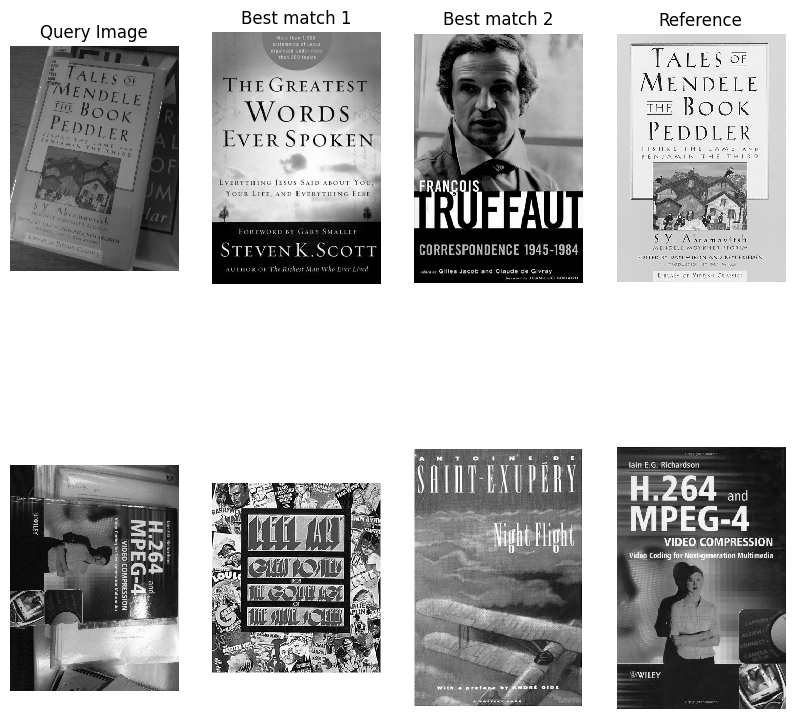

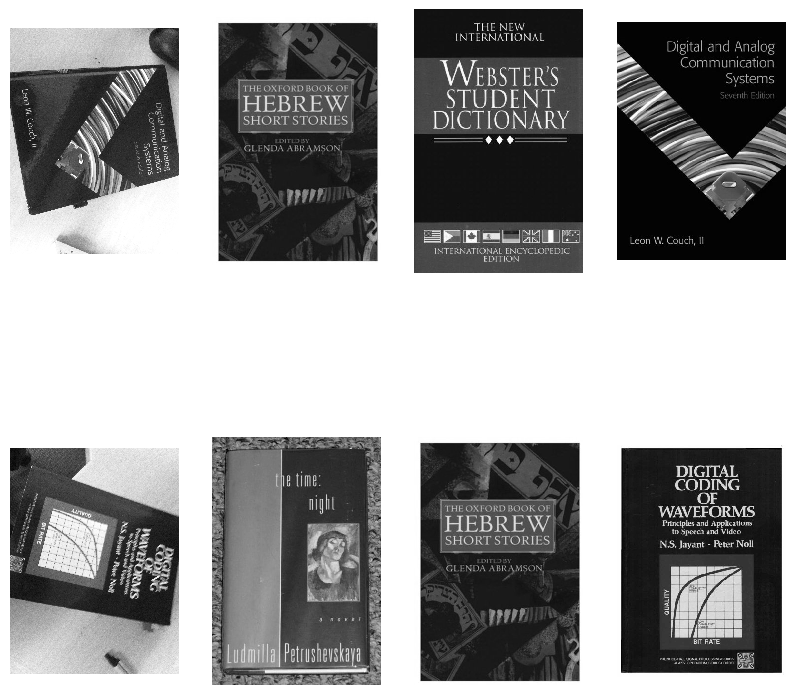

In [33]:
plt.figure(figsize=(10, 10))

plt.subplot(241)
plt.axis('off')
plt.title("Query Image")
plt.imshow(images_que[wrong_k[0]][1])
plt.subplot(242)
plt.axis('off')
plt.title("Best match 1")
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[0]][0][0]][1])
plt.subplot(243)
plt.axis('off')
plt.title("Best match 2")
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[0]][1][0]][1])
plt.subplot(244)
plt.axis('off')
plt.title("Reference")
plt.imshow(images_ref[wrong_k[0]][1])

plt.subplot(245)
plt.axis('off')
plt.imshow(images_que[wrong_k[1]][1])
plt.subplot(246)
plt.axis('off')
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[1]][0][0]][1])
plt.subplot(247)
plt.axis('off')
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[1]][1][0]][1])
plt.subplot(248)
plt.axis('off')
plt.imshow(images_ref[wrong_k[1]][1])
plt.show()

plt.figure(figsize=(10, 10))

plt.subplot(241)
plt.axis('off')
plt.imshow(images_que[wrong_k[2]][1])
plt.subplot(242)
plt.axis('off')
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[2]][0][0]][1])
plt.subplot(243)
plt.axis('off')
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[2]][1][0]][1])
plt.subplot(244)
plt.axis('off')
plt.imshow(images_ref[wrong_k[2]][1])

plt.subplot(245)
plt.axis('off')
plt.imshow(images_que[wrong_k[3]][1])
plt.subplot(246)
plt.axis('off')
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[3]][0][0]][1])
plt.subplot(247)
plt.axis('off')
plt.imshow(images_ref[best_score_wrong_k5[wrong_k[3]][1][0]][1])
plt.subplot(248)
plt.axis('off')
plt.imshow(images_ref[wrong_k[3]][1])
plt.show()

**In this part, we tried to identify images by comparing them to references. In order to do so, for each image (querry and reference), we have searched for keypoints and extracted descriptors thanks to the ORB algorithm. Then we searched for matches between the querry images and the reference images to find the pairs of keypoints that match between the images.
Then we eliminated the false matches by using the RANSAC method by calculating the geometric transformation between the two images and eliminating the matches that do not fit well to this transformation.
Then, we compute the number of inliers which indicates the quality of the match between the images. The higher the number of inliers, the more likely the two images are to represent the same object.**

**The number of inliers allowed us to rank the matches from the most likely to the least likely by eliminating the matches with a too low number of inliers. 
When the first match was not the correct identification, we could use the "top-k" method to evaluate the match, the number of inliers can be used to determine the best match among the k closest matches.**

**However, although the accuracy is 0.82 after this method, errors remain. Indeed, these errors are due to several factors. First, if the images have significant differences in scale, this can lead to inconsistencies in the ORB descriptors. In addition, a change in orientation can also affect the descriptors. 
On the other hand, the presence of noise or a change in brightness affects the identification of key points that may be missing or misidentified.
Finally, to fix these problems, we can play on the ORB parameters as we saw in question 1.**


Now let's add additional images of objects that are not in the reference dataset.

In [34]:
name_ref = "A2_smvs/book_covers/Reference/"
name_que = "A2_smvs/book_covers/Query/"
images_ref, images_que = import_img(name_ref, name_que)
par_references, par_query = get_param(images_que, images_ref, n_features= 1000)

In [35]:
best_score_k5 = identify_images(images_que, images_ref, par_references, par_query, k=5, thr = 14)

In [36]:
n = len(best_score_k5)

accuracy_2 = 0
wrong_2 = []

for i in range(1, 102):
  score_i = best_score_k5[i]
  correct = False
  for j in range(len(score_i)):
    if i == score_i[j][0]:
      accuracy_2+=1
      correct = True
  if not correct:
    wrong_2.append(i)
for i in range(102, 105):
  score_i = best_score_k5[i]
  if len(score_i) == 0:
    accuracy_2+=1
  else:
    wrong_2.append(i)

In [37]:
print("Result without images without matches")
print("Accuracy =", accuracy_k/101)
print("Wrongs =", wrong_k)
print( )
print("Result with images without matches")
print("Accuracy =", accuracy_2/n)
print("Wrongs=", wrong_2)

Result without images without matches
Accuracy = 0.8217821782178217
Wrongs = [37, 55, 63, 67, 68, 69, 71, 73, 75, 77, 78, 84, 89, 91, 97, 98, 100, 101]

Result with images without matches
Accuracy = 0.7788461538461539
Wrongs= [33, 37, 55, 63, 67, 68, 69, 70, 71, 73, 75, 76, 77, 78, 82, 84, 87, 89, 91, 97, 98, 100, 101]


We notice that the accuracy remains almost stable by changing some parameters, especially the score threshold. Indeed, to make sure that the added images do not match any other images, the minimum score of the matches to obtain had to be increased.   
In fact, if the minimum score was too low, the images without references would still match with a reference image. Therefore, to increase the accuracy, the threshold was set to 14.

Now let's try it on a new image bank (landscape).


In [38]:
name_ref = "A2_smvs/landmarks/Reference/"
name_que = "A2_smvs/landmarks/Query/"
images_ref, images_que = import_img(name_ref, name_que)
par_references, par_query = get_param(images_que, images_ref, n_features= 1000)

In [39]:
best_score_landmarks = identify_images(images_que[:100], images_ref, par_references, par_query, k=5, thr = 10)

In [40]:
n = len(best_score_landmarks)
accuracy_landmarks = 0
wrong_landmarks = []
for i in range(1, 101):
  score_i = best_score_landmarks[i]
  correct = False
  for j in range(len(score_i)):
    if i == score_i[j][0]:
      accuracy_landmarks+=1
      correct = True
  if not correct:
    wrong_landmarks.append(i)


In [41]:
best_score_landmarks_2 = identify_images(images_que, images_ref, par_references, par_query, k=5, thr = 10)

In [51]:
n = len(best_score_landmarks_2)

accuracy_landmarks_2 = 0
wrong_landmarks_2 = []

for i in range(1, 101):
  score_i = best_score_landmarks_2[i]
  correct = False
  for j in range(len(score_i)):
    if i == score_i[j][0]:
      accuracy_landmarks_2+=1
      correct = True
  if not correct:
    wrong_landmarks_2.append(i)
for i in range(102, 105):
  score_i = best_score_landmarks_2[i]
  if len(score_i) == 0:
    accuracy_landmarks_2+=1
  else:
    wrong_landmarks_2.append(i)

In [53]:
print("Result without images without matches")
print("Accuracy =", accuracy_landmarks/101)
print("Wrongs =", wrong_landmarks)
print( )
print("Result with images without matches")
print("Accuracy =", accuracy_landmarks_2/n)
print("Wrongs =", wrong_landmarks_2)

Result without images without matches
Accuracy = 0.37623762376237624
Wrongs = [1, 3, 5, 8, 9, 10, 11, 13, 14, 15, 16, 20, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 48, 49, 52, 53, 55, 56, 57, 58, 59, 62, 64, 65, 66, 67, 71, 72, 76, 77, 80, 84, 86, 87, 89, 90, 91, 94, 95, 97]

Result with images without matches
Accuracy = 0.375
Wrongs = [1, 3, 5, 8, 9, 10, 11, 13, 14, 15, 16, 20, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 48, 49, 52, 53, 55, 56, 57, 58, 59, 62, 64, 65, 66, 67, 71, 72, 76, 77, 80, 84, 86, 87, 89, 90, 91, 94, 95, 97, 102, 103]


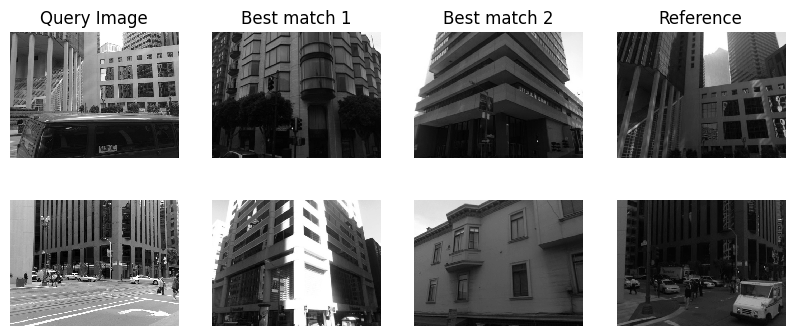

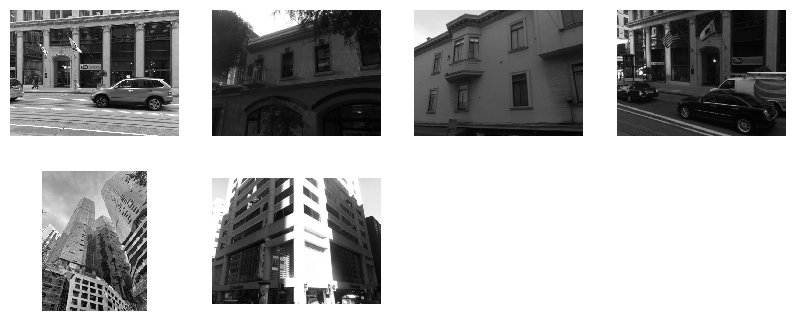

In [44]:
plt.figure(figsize=(10, 4))

plt.subplot(241)
plt.axis('off')
plt.title("Query Image")
plt.imshow(images_que[wrong_landmarks_2[0]][1])
plt.subplot(242)
plt.axis('off')
plt.title("Best match 1")
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[0]][0][0]][1])
plt.subplot(243)
plt.axis('off')
plt.title("Best match 2")
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[0]][1][0]][1])
plt.subplot(244)
plt.axis('off')
plt.title("Reference")
plt.imshow(images_ref[wrong_landmarks_2[0]][1])

plt.subplot(245)
plt.axis('off')
plt.imshow(images_que[wrong_landmarks_2[1]][1])
plt.subplot(246)
plt.axis('off')
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[1]][0][0]][1])
plt.subplot(247)
plt.axis('off')
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[1]][1][0]][1])
plt.subplot(248)
plt.axis('off')
plt.imshow(images_ref[wrong_landmarks_2[1]][1])
plt.show()

plt.figure(figsize=(10, 4))

plt.subplot(241)
plt.axis('off')
plt.imshow(images_que[wrong_landmarks_2[2]][1])
plt.subplot(242)
plt.axis('off')
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[2]][0][0]][1])
plt.subplot(243)
plt.axis('off')
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[2]][1][0]][1])
plt.subplot(244)
plt.axis('off')
plt.imshow(images_ref[wrong_landmarks_2[2]][1])

plt.subplot(245)
plt.axis('off')
plt.imshow(images_que[wrong_landmarks_2[-1]][1])
plt.subplot(246)
plt.axis('off')
plt.imshow(images_ref[best_score_landmarks_2[wrong_landmarks_2[-1]][0][0]][1])
plt.show()

We see that the accuracy in both cases is very low. Indeed, the exposures of the images are not the same as well as their orientation. Thus, when the brightness of the images differ, the keypoints are not well located. In addition, the descriptors are not identical for two same keypoints because the orientation of the images is very different. Therefore, the identification is made difficult.  
To improve the identification, we can first adjust the brightness and contrast of the image to facilitate the identification of keypoints. We can also rotate the image to make the descriptors identical. Finally, we can also play on the ORB parameters by increasing the value of the detection threshold to detect only the most robust features of the image for example.

Let's try to improve the contrast and the brightness of the images and change the parameters.

In [105]:
name_ref = "A2_smvs/landmarks/Reference/"
name_que = "A2_smvs/landmarks/Query/"
images_ref_eq, images_que_eq = import_img(name_ref, name_que, True)
par_references_eq, par_query_eq = get_param(images_que, images_ref, n_features= 1500)

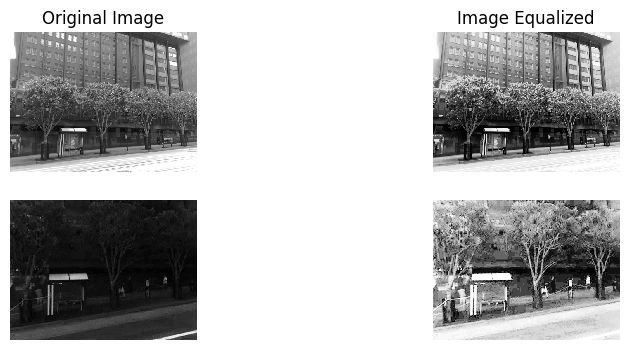

In [89]:
plt.figure(figsize=(10, 4))
n=14
plt.subplot(221)
plt.axis('off')
plt.title("Original Image")
plt.imshow(images_que[n][1])
plt.subplot(222)
plt.axis('off')
plt.title("Image Equalized")
plt.imshow(images_que_eq[n][1])
plt.subplot(223)
plt.axis('off')
plt.imshow(images_ref[n][1])
plt.subplot(224)
plt.axis('off')
plt.imshow(images_ref_eq[n][1])
plt.show()

In [117]:
best_score_landmarks_eq = identify_images(images_que_eq, images_ref_eq, par_references_eq, par_query_eq, k=5, thr = 10, ratio = 0.78)

In [118]:
n = len(best_score_landmarks_eq)

accuracy_landmarks_eq = 0
wrong_landmarks_eq = []

for i in range(1, 101):
  score_i = best_score_landmarks_eq[i]
  correct = False
  for j in range(len(score_i)):
    if i == score_i[j][0]:
      accuracy_landmarks_eq+=1
      correct = True
  if not correct:
    wrong_landmarks_eq.append(i)
for i in range(102, 105):
  score_i = best_score_landmarks_eq[i]
  if len(score_i) == 0:
    accuracy_landmarks_eq+=1
  else:
    wrong_landmarks_eq.append(i)
print("Result with improvment")
print("Accuracy =", accuracy_landmarks_eq/n)
print("Wrongs=", wrong_landmarks_eq)

Result with improvment
Accuracy = 0.4326923076923077
Wrongs= [3, 4, 8, 9, 10, 14, 15, 16, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 45, 46, 47, 48, 52, 53, 55, 56, 57, 58, 59, 61, 62, 63, 64, 66, 67, 71, 72, 76, 77, 80, 84, 86, 87, 89, 90, 91, 94, 95, 97, 102]


With these results, we can conclude that in this case, changing the contrast and brightness did not change the accuracy. However, by modifying the ratio, we modify the precision.
The ratio reduces the number of false matches, which improves the accuracy of the ORB-based keypoint matching algorithm. This is especially important here because images have lighting changes, which can cause false matches.  
However, the choice of the threshold for the ratio can impact the accuracy of the identification. If the threshold is too high, correct matches may be rejected, while a threshold that is too low may cause false matches to be maintained.

___
# CONCLUSION

**The ORB algorithm allows the detection and description of keypoints in images. This makes it possible to compare two images and to find one image in another by finding a geometric transformation in it. 
This allows us to identify objects by comparing an image to a database with a higher or lower accuracy.
The accuracy depends on several factors such as the quality of the image, the texture of the scene, the size and spread of the keypoints, and the ORB parameters chosen. Under ideal conditions such as with book covers, ORB can achieve high accuracy in identifying an image.**

**However, in more complex situations, the accuracy of the ORB algorithm can be affected by problems such as the detection of false keypoints or the difficulty to correctly associate the keypoints between different images. Therefore, it is important to set the parameters of ORB in order to optimize its use.**